<a href="https://www.kaggle.com/code/williamtbarker/porsche-911-auction-eda?scriptVersionId=153765772" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

**This is Exploratory Data Analysis of approximately 5,000 Porsche 911 auctions**

In [1]:
import numpy as np
import pandas as pd

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/porsche-911-auctions/28NOV23_porsche_911_data_cleaned.csv


**Import Data**

In [2]:
df = pd.read_csv("/kaggle/input/porsche-911-auctions/28NOV23_porsche_911_data_cleaned.csv")
df.head()

,url,seller,location,title,submodel,listing_details,private_party_or_dealer,lot,status,views,...,owners,zip_code,sold_price,sold_date,year,mileage,latitude,longitude,sales_price_standardized,sales_price_normalized
0,https://bringatrailer.com/listing/1997-porsche...,: pmotoring,"La Mesa, California 91942",1997 Porsche 911 Carrera Targa 6-Speed,Porsche 993 911 (Non-Turbo/GT2),Chassis: WP0DA2991VS385205 107k Miles Shown 3....,: Dealer,#128412,"Sold for $85,500 on 11/22/23","11,710",...,CARFAX 1-Owner vehicle,91942,85500.0,2023-11-22,1997.0,107000.0,32.784549,-117.016349,0.059669,0.059669
1,https://bringatrailer.com/listing/2018-porsche...,: mark_starr,"Mount Kisco, New York 10549",14k-Mile 2018 Porsche 911 Carrera 4S Cabriolet,Porsche 991 911 (Non-Turbo/GT2/GT3),Chassis: WP0CB2A99JS147164 14k Miles Twin-Turb...,: Dealer,#128239,"Sold for $106,000 on 11/20/23","6,401",...,CARFAX 1-Owner vehicle,10549,106000.0,2023-11-20,2018.0,14000.0,37.621440,126.893215,0.076013,0.076013
2,https://bringatrailer.com/listing/1996-porsche...,: SWVintage,"Phoenix, Arizona 85018",28k-Mile 1996 Porsche 911 Carrera 4S 6-Speed,Porsche 993 911 (Non-Turbo/GT2),Chassis: WP0AA2999TS321414 28k Miles Shown 3.6...,: Dealer,#128255,"Sold for $181,993 on 11/20/23","22,258",...,"Types of owners: Corporate, Personal",85018,181993.0,2023-11-20,1996.0,28000.0,48.554002,37.231345,0.136596,0.136596
3,https://bringatrailer.com/listing/2003-porsche...,: ExclusiveMotorClub,"Chandler, Arizona 85226",2003 Porsche 911 Carrera 4S Coupe 6-Speed,Porsche 996 911 (Non-Turbo/GT2/GT3),Chassis: WP0AA29933S624012 76k Miles 3.6-Liter...,: Dealer,#128233,"Sold for $36,000 on 11/20/23","10,402",...,"Types of owners: Lease, Personal",85226,36000.0,2023-11-20,2003.0,76000.0,33.309308,-111.922032,0.020207,0.020207
4,https://bringatrailer.com/listing/2014-porsche...,: Worldclassmotorcars,"Wildwood, Missouri 63005",19k-Mile 2014 Porsche 911 Carrera 4S Cabriolet,Porsche 991 911 (Non-Turbo/GT2/GT3),Chassis: WP0CB2A90ES154445 19k Miles 3.8-Liter...,: Dealer,#128353,"Sold for $71,500 on 11/21/23","7,051",...,2Previous owners,63005,71500.0,2023-11-21,2014.0,19000.0,57.975220,26.961682,0.048508,0.048508


In [3]:
df.describe()

,comments,zip_code,sold_price,year,mileage,latitude,longitude,sales_price_standardized,sales_price_normalized
count,4725.000000,4725.000000,4.725000e+03,4725.000000,4.725000e+03,4725.000000,4725.000000,4725.000000,4725.000000
mean,72.294180,57790.940317,9.781048e+04,1999.132487,9.057078e+04,39.247287,-25.650788,0.069484,0.069484
std,45.087686,33312.932265,8.648300e+04,13.034435,1.736169e+05,12.325414,73.940709,0.068947,0.068947
min,8.000000,1002.000000,1.065400e+04,1965.000000,0.000000e+00,-34.752023,-157.924193,0.000000,0.000000
25%,43.000000,28602.000000,4.725000e+04,1989.000000,2.900000e+04,33.848307,-89.633093,0.029175,0.029175
50%,62.000000,63124.000000,7.099600e+04,2001.000000,5.300000e+04,39.165875,-2.051134,0.048106,0.048106
75%,89.000000,91325.000000,1.200000e+05,2008.000000,8.700000e+04,48.265076,23.729137,0.087174,0.087174
max,1019.000000,99507.000000,1.265000e+06,2024.000000,7.200000e+06,66.932900,136.081880,1.000000,1.000000


**Data Exploration and Cleaning**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   url                       4725 non-null   object 
 1   seller                    4725 non-null   object 
 2   location                  4725 non-null   object 
 3   title                     4725 non-null   object 
 4   submodel                  4724 non-null   object 
 5   listing_details           4725 non-null   object 
 6   private_party_or_dealer   4723 non-null   object 
 7   lot                       4725 non-null   object 
 8   status                    4725 non-null   object 
 9   views                     4725 non-null   object 
 10  watchers                  4725 non-null   object 
 11  comments                  4725 non-null   int64  
 12  accidents                 400 non-null    object 
 13  owners                    383 non-null    object 
 14  zip_code

We need to handle the missing values in "accidents", "owners", "submodel", and "private_party_or_dealer"

In [5]:
# Drop columns with excessive missing values
df_cleaned = df.drop(columns=['accidents', 'owners'])

# Drop rows with missing submodel
df_cleaned = df_cleaned.dropna(subset=['submodel'])

# Drop rows with missing values in 'private_party_or_dealer'
df_cleaned = df_cleaned.dropna(subset=['private_party_or_dealer'])

# Display the first few rows of the cleaned dataframe
print(df_cleaned.head())

# Check info of the cleaned dataframe
print(df_cleaned.info())

# Check the shape of the cleaned dataframe
print("Shape of the cleaned dataframe:", df_cleaned.shape)

# Convert 'sold_date' to datetime type
df_cleaned['sold_date'] = pd.to_datetime(df_cleaned['sold_date'])

# Feature Engineering - Add Car Age
df_cleaned['car_age'] = 2023 - df_cleaned['year']

                                                 url                 seller  \
0  https://bringatrailer.com/listing/1997-porsche...            : pmotoring   
1  https://bringatrailer.com/listing/2018-porsche...           : mark_starr   
2  https://bringatrailer.com/listing/1996-porsche...            : SWVintage   
3  https://bringatrailer.com/listing/2003-porsche...   : ExclusiveMotorClub   
4  https://bringatrailer.com/listing/2014-porsche...  : Worldclassmotorcars   

                      location  \
0    La Mesa, California 91942   
1  Mount Kisco, New York 10549   
2       Phoenix, Arizona 85018   
3      Chandler, Arizona 85226   
4     Wildwood, Missouri 63005   

                                            title  \
0          1997 Porsche 911 Carrera Targa 6-Speed   
1  14k-Mile 2018 Porsche 911 Carrera 4S Cabriolet   
2    28k-Mile 1996 Porsche 911 Carrera 4S 6-Speed   
3       2003 Porsche 911 Carrera 4S Coupe 6-Speed   
4  19k-Mile 2014 Porsche 911 Carrera 4S Cabriolet   

 

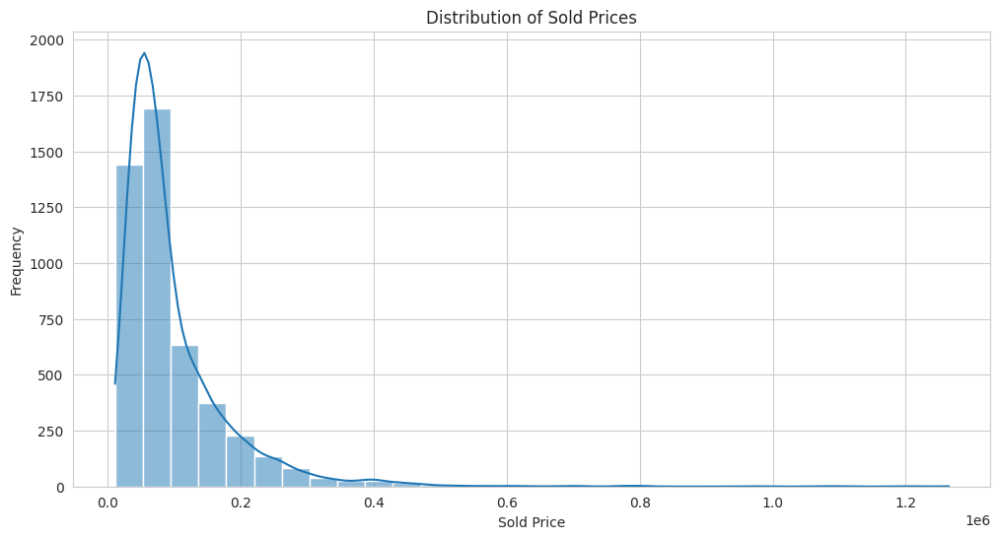

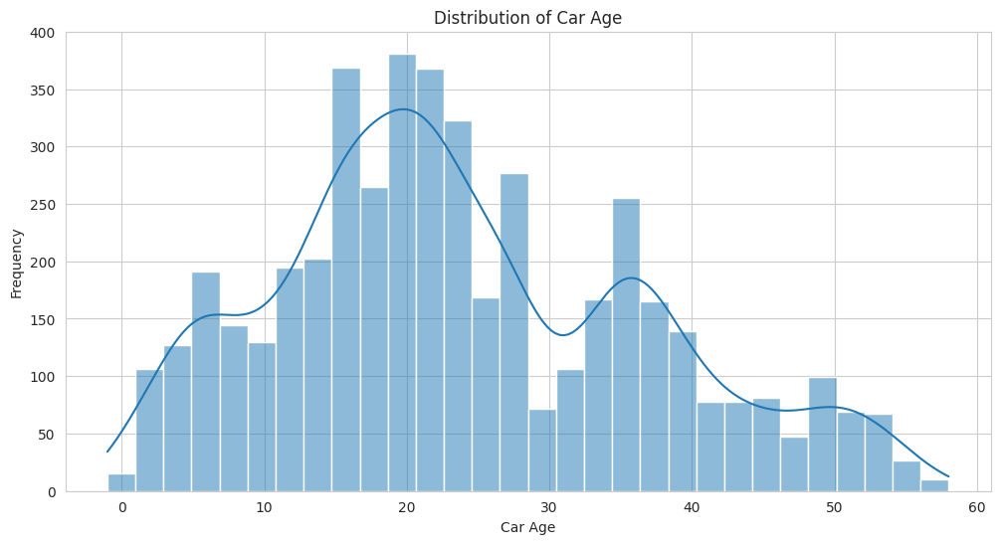

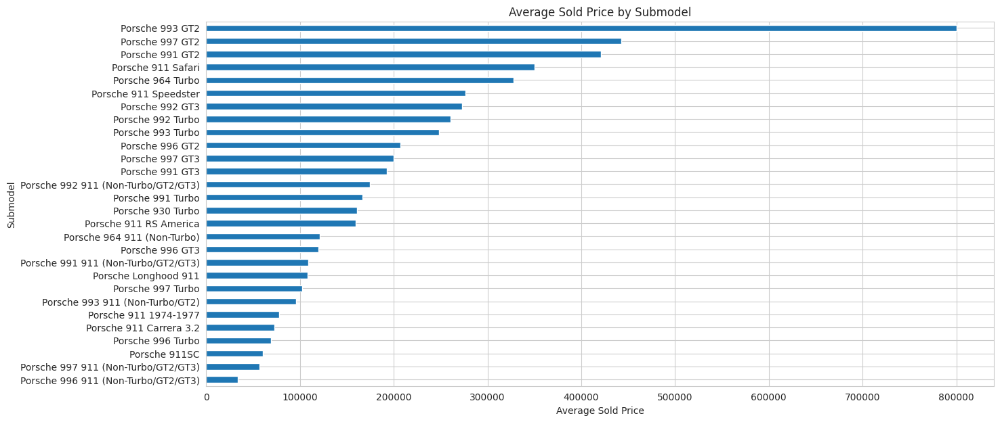

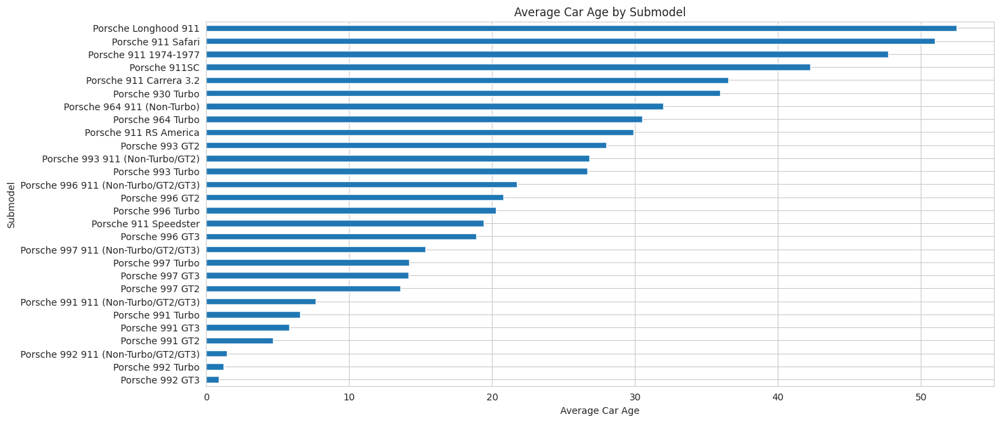

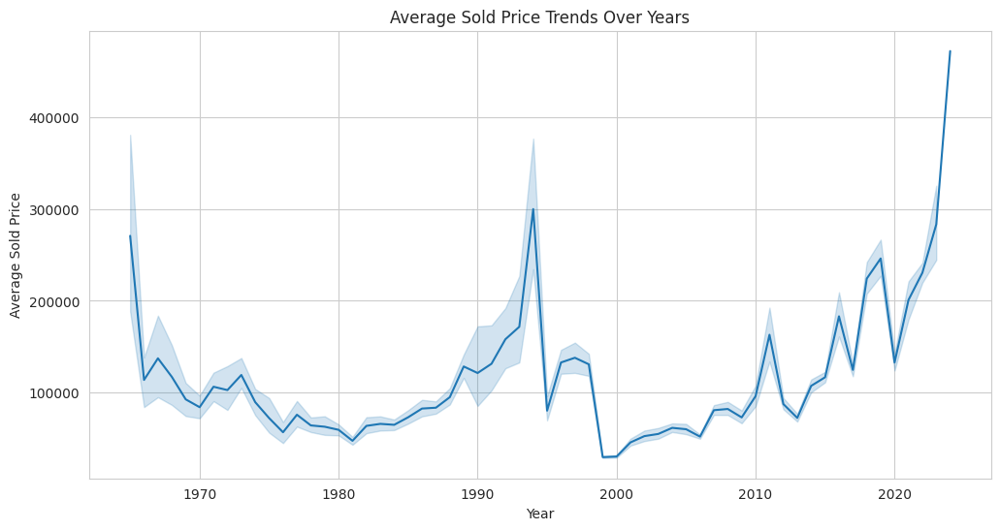

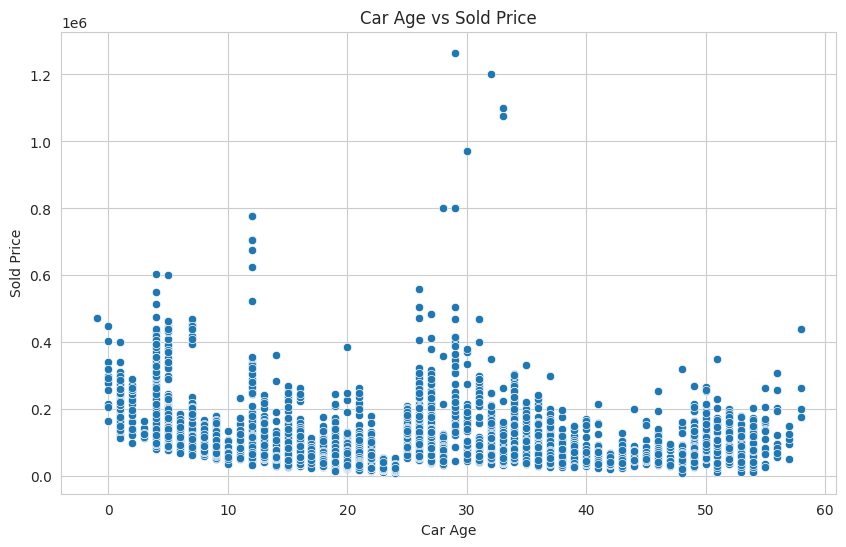

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Step 1: Analyze Distributions
# Histogram for 'sold_price'
plt.figure(figsize=(12, 6))
sns.histplot(df_cleaned['sold_price'], kde=True, bins=30)
plt.title('Distribution of Sold Prices')
plt.xlabel('Sold Price')
plt.ylabel('Frequency')
plt.show()

# Histogram for 'car_age'
plt.figure(figsize=(12, 6))
sns.histplot(df_cleaned['car_age'], kde=True, bins=30)
plt.title('Distribution of Car Age')
plt.xlabel('Car Age')
plt.ylabel('Frequency')
plt.show()

# Step 2: Submodel Analysis - Average Sold Price and Average Age by Submodel
# Average Sold Price by Submodel
plt.figure(figsize=(15, 7))
submodel_price = df_cleaned.groupby('submodel')['sold_price'].mean().sort_values()
submodel_price.plot(kind='barh')
plt.title('Average Sold Price by Submodel')
plt.xlabel('Average Sold Price')
plt.ylabel('Submodel')
plt.show()

# Average Car Age by Submodel
plt.figure(figsize=(15, 7))
submodel_age = df_cleaned.groupby('submodel')['car_age'].mean().sort_values()
submodel_age.plot(kind='barh')
plt.title('Average Car Age by Submodel')
plt.xlabel('Average Car Age')
plt.ylabel('Submodel')
plt.show()

# Step 3: Price Trends Over Time
# Convert 'year' to integer for plotting
df_cleaned['year'] = df_cleaned['year'].astype(int)
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_cleaned, x='year', y='sold_price', estimator='mean')
plt.title('Average Sold Price Trends Over Years')
plt.xlabel('Year')
plt.ylabel('Average Sold Price')
plt.show()

# Step 4: Correlation Analysis - Car Age vs Sold Price
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x='car_age', y='sold_price')
plt.title('Car Age vs Sold Price')
plt.xlabel('Car Age')
plt.ylabel('Sold Price')
plt.show()


In [7]:
import folium

# Create a base map
map = folium.Map(location=[39.50, -98.35], zoom_start=4)  # Adjust the location and zoom level to your data

# Add points to the map
for idx, row in df_cleaned.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=5,
                        popup=f"Sold Price: {row['sold_price']}, Year: {row['year']}",
                        fill=True).add_to(map)

# Display the map
map


Building a Color-Coded map of Submodels

In [8]:
import folium
from branca.colormap import linear

# Create a base map
map = folium.Map(location=[39.50, -98.35], zoom_start=5)  # Centered on the USA, adjust as needed

# Create a color map for the submodels
submodels = df_cleaned['submodel'].unique()
colormap = linear.Set1_09.scale(0, len(submodels)).to_step(len(submodels))
colormap = {submodels[i]: colormap.rgb_hex_str(i) for i in range(len(submodels))}

# Add markers to the map
for idx, row in df_cleaned.iterrows():
    color = colormap.get(row['submodel'], 'black')  # Default to black if submodel not in colormap
    popup_text = f"Submodel: {row['submodel']}<br>Sold Price: {row['sold_price']}<br>Year: {row['year']}"
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=5,
                        color=color,
                        popup=popup_text,
                        fill=True).add_to(map)

# Display the map
map


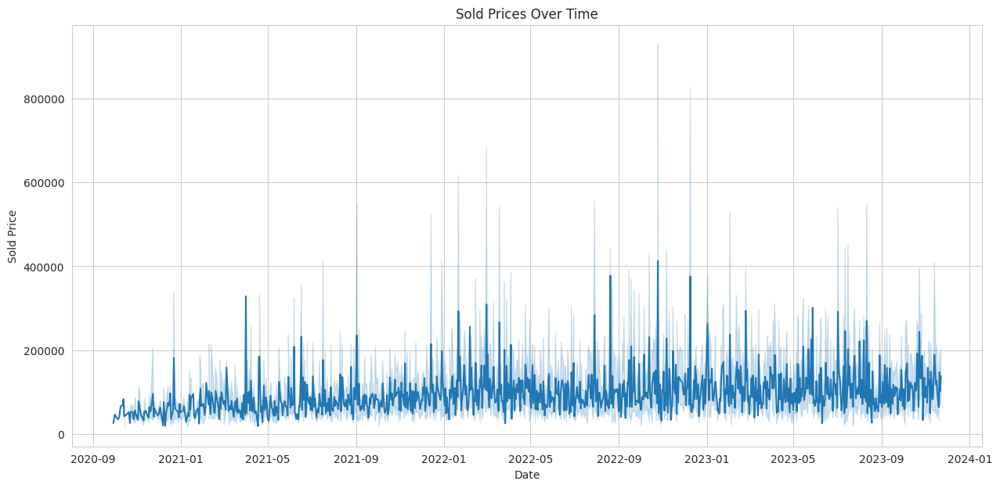

In [9]:
# Plotting sold prices over time
plt.figure(figsize=(15, 7))
sns.lineplot(data=df_cleaned, x='sold_date', y='sold_price')
plt.title('Sold Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Sold Price')
plt.show()


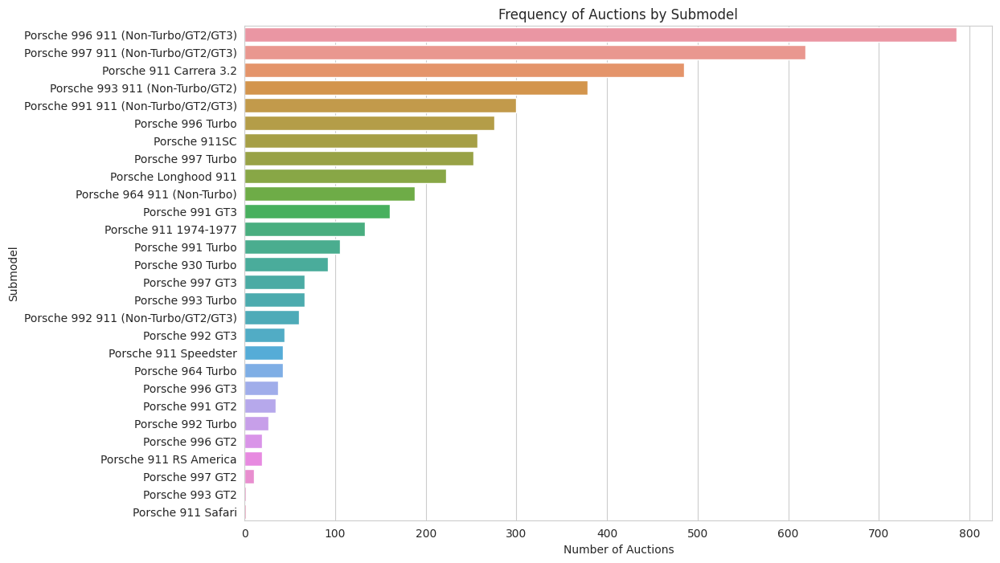

In [10]:
# Submodel frequency
submodel_counts = df_cleaned['submodel'].value_counts()

plt.figure(figsize=(12, 8))
sns.barplot(y=submodel_counts.index, x=submodel_counts.values)
plt.title('Frequency of Auctions by Submodel')
plt.xlabel('Number of Auctions')
plt.ylabel('Submodel')
plt.show()


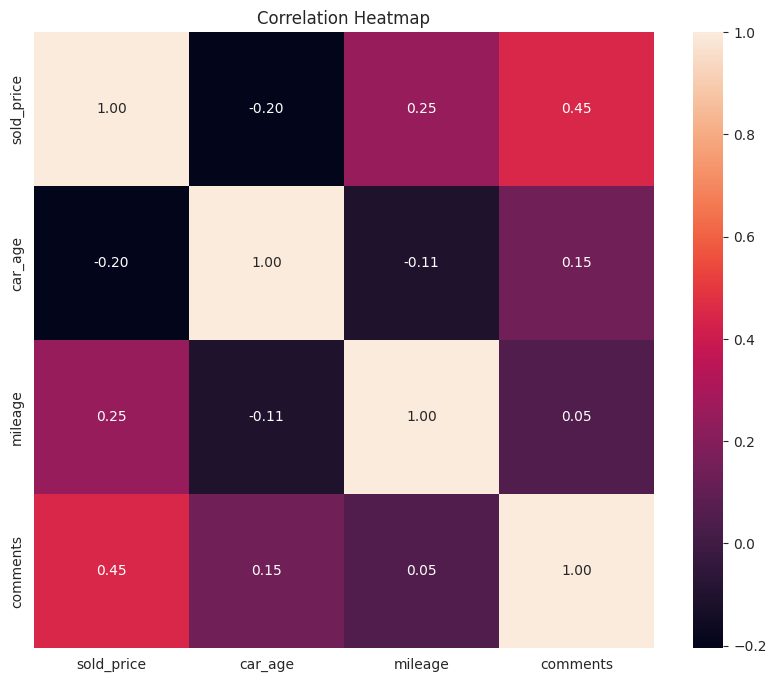

In [11]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df_cleaned[['sold_price', 'car_age', 'mileage', 'comments']].corr(), annot=True, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()
